# Homework Answer

* Họ và tên: Nguyễn Vạn Phúc Huy 
* MSSV: 23110163



1. Practice on Numerical Data

Task:
Use the noise generation function provided above and apply it to the following example:

```python
# Example data
data = np.array([10, 20, 30, 40, 50])
noisy_data = np.clip(noisy_data, 0, 1)
print("Data after adding noise:", noisy_data)
```

- Requirements:

  - Normalize the array data to the range [0, 1] before adding noise.

  - Ensure that all resulting values remain within [0, 1] after adding noise.

- Questions:

  - Try different noise ranges such as (-0.5, 0.5) and (-5, 10).

  - Record your observations about how the data changes under different noise levels.


2. Practice on Images

Task:
  - Use an external image and apply the noise generation functions covered earlier.

    - Experiment with different parameter values for the noise functions.

    - Plot histograms of both the original image and the noisy images.

    - Write short observations about the differences between the original and noisy images.

  - Add Gaussian, Salt & Pepper, Speckle, and Poisson noise to the same image with different intensity levels.

    - Plot histograms and compare their shapes.

    - How does each noise type affect bright and dark regions differently?

    - Which type of noise is more perceptually noticeable?


3. Harmonic Mean and Geometric Mean Filters

  - Find an image from the internet and perform the following steps:

    - Add noise to the image using the previously introduced noise methods.

    - Apply Harmonic Mean Filter and Geometric Mean Filter with kernel sizes 3×3 and 5×5.

    - Compare the denoising results and write short
    comments:

      - Which type of noise is reduced effectively?

      - Which type of noise remains unaffected?

      - Explain why these filters perform better or worse depending on the noise type.

4. Applying Basic Convolution Filters

Task:
Choose an image from the internet and perform the following operations:

- Apply blurring filters with kernel sizes 3×3 and 5×5. Compute and display the blur measurement value for each filtered image. Overlay the blur value text directly on the image.

- Apply sharpening filters. Compute and display the sharpness measurement value for each image. Overlay the sharpness value text on the image.

- Additional Tasks:

  - Define a blur threshold based on the blur measurement values.

  - For each image:

    - If the image exceeds the blur threshold → add the label “Blur Image: [value]”.

    - Otherwise → label the image as “Good Image”.

    - Save all evaluated images into a folder named “Image_BlurDetection_Output”.


  - Apply edge detection filters and describe their purpose and visual meaning.

5. Report

- Display the original image and all transformed images.

- Write a short commentary comparing the visual differences between them and describe what you observe from each transformation.

Import Libs

In [44]:
import numpy as np
import cv2
from matplotlib import pyplot as plt
import os
import gdown
import matplotlib
import matplotlib.pyplot as plt
import numpy as np

from cv2 import imwrite, imread
from skimage import data, exposure, img_as_float, img_as_ubyte
from skimage import exposure
from skimage import io
from skimage.exposure import match_histograms

## Noise Generation Functions

### **Impulse noise**


- Impulse noise, commonly known as salt-and-pepper noise, is a type of noise that randomly replaces some pixel values in an image with either the maximum (white – “salt”) or minimum (black – “pepper”) intensity values.

- This noise typically occurs during image acquisition or transmission due to bit errors, faulty sensors, or data loss. As a result, the affected pixels appear as random black and white dots scattered over the image.

In [45]:
def add_impulse_noise(image, prob):
    """
    Adds impulse (salt & pepper) noise to an image.

    Args:
    - image: Input image (numpy array).
    - prob: Probability of adding noise (0 < prob < 1).

    Returns:
    - noisy_img: Image with added noise.
    """
    # Create a copy of the original image to avoid modifying it directly
    noisy_img = image.copy()
    # Generate a random matrix with the same dimensions as the image
    random_matrix = np.random.rand(*image.shape[:2])

    # Add "salt" noise (white pixels)
    noisy_img[random_matrix < prob/2] = 255

    # Add "pepper" noise (black pixels)
    noisy_img[random_matrix > 1 - prob/2] = 0

    return noisy_img


### **Gaussian noise**

- Gaussian noise is a type of statistical noise whose values follow a normal (Gaussian) distribution. It affects almost all pixels in an image by adding random variations in intensity values. This noise is common in digital images due to sensor thermal noise, low light conditions, or electronic circuit interference during image acquisition.

In [46]:
def add_gaussian_noise(image, mean, sigma):
    """
    Adds Gaussian noise to an image.

    Args:
    - image: Input image (numpy array).
    - mean: Mean of the Gaussian distribution (default is 0).
    - sigma: Standard deviation of the Gaussian distribution (controls noise intensity).

    Returns:
    - noisy_img: Image with added Gaussian noise.
    """
    # Generate Gaussian noise
    gaussian_noise = np.random.normal(mean, sigma, image.shape).astype(np.float32)

    # Add the Gaussian noise to the image
    noisy_img = image.astype(np.float32) + gaussian_noise

    # Clip pixel values to be in the valid range [0, 255]
    noisy_img = np.clip(noisy_img, 0, 255).astype(np.uint8)

    return noisy_img

### **Speckle noise**

- Speckle noise is a type of multiplicative noise that typically appears in coherent imaging systems such as radar, sonar, ultrasound, and laser imaging.

- Unlike additive noise (e.g., Gaussian noise), speckle noise depends on the intensity of the original image — brighter regions are more affected than darker ones.

In [47]:
def add_speckle_noise(image, sigma):
    """
    Adds speckle noise to an image.

    Args:
    - image: Input image (numpy array).
    - sigma: Standard deviation of the speckle noise (controls noise intensity).

    Returns:
    - noisy_img: Image with added speckle noise.
    """
    # Convert the image to float32 for accurate calculations
    image = image.astype(np.float32) / 255.0

    # Generate speckle noise (multiplicative noise)
    noise = np.random.randn(*image.shape) * sigma

    # Add the speckle noise to the image
    noisy_img = image + image * noise

    # Clip pixel values to the range [0, 1] and convert back to uint8
    noisy_img = np.clip(noisy_img, 0, 1)
    noisy_img = (noisy_img * 255).astype(np.uint8)

    return noisy_img

### **Uniform Noise**

- Uniform noise is a type of additive noise where the noise values are evenly distributed across a specific range.
- That means every intensity value within the range has an equal probability of occurring.
It is one of the simplest and most predictable noise models used in image processing experiments.

In [48]:
def add_uniform_noise(img, noise_range):
    """
    Thêm nhiễu uniform vào ảnh đầu vào.

    Parameters:
        img (numpy.ndarray): Ảnh gốc (dạng mảng NumPy).
        noise_range (tuple): Khoảng giá trị nhiễu (min, max), thường nằm trong khoảng [-1, 1] nếu ảnh được chuẩn hóa.

    Returns:
        numpy.ndarray: Ảnh sau khi thêm nhiễu.
    """
    # Kiểm tra nếu ảnh có giá trị pixel từ 0 đến 255 thì chuẩn hóa về [0, 1]
    if img.dtype == np.uint8:
        img = img / 255.0

    # Tạo nhiễu uniform cùng kích thước với ảnh
    noise = np.random.uniform(low=noise_range[0], high=noise_range[1], size=img.shape)

    # Thêm nhiễu vào ảnh
    noisy_img = img + noise

    # Đảm bảo giá trị pixel nằm trong khoảng [0, 1]
    noisy_img = np.clip(noisy_img, 0, 1)

    # Chuyển ảnh về dạng uint8 nếu cần
    noisy_img = (noisy_img * 255).astype(np.uint8)

    return noisy_img

### **Poisson Noise**
- Poisson noise, also known as shot noise, is a type of statistical noise that arises from the discrete nature of light and other particles. It is particularly relevant in low-light imaging conditions where the number of photons detected is small.
- In images affected by Poisson noise, the variance of the noise is proportional to the intensity of the signal. This means that brighter areas of the image will have more noise compared to darker areas.


In [49]:
def add_poisson_noise(image):
    """
    Adds Poisson noise to an image.

    Args:
    - image: Input image (numpy array).

    Returns:
    - noisy_img: Image with added Poisson noise.
    """
    # Scale the image to the range of [0, 1]
    image = image.astype(np.float32) / 255.0

    # Generate Poisson noise
    noisy_img = np.random.poisson(image * 255) / 255.0

    # Clip pixel values to be in the valid range [0, 1] and convert back to uint8
    noisy_img = np.clip(noisy_img, 0, 1)
    noisy_img = (noisy_img * 255).astype(np.uint8)

    return noisy_img

## Filter

### Denoise

#### **Harmonic mean filter**

- The Harmonic Mean Filter is a spatial domain filtering technique used to reduce noise in digital images, particularly salt noise (bright dots).
- It is especially effective when the image is corrupted by impulse noise that affects high-intensity pixels.


In [50]:
def harmonic_mean_filter(noisy_image, kernel_size):
    """
    Apply Harmonic Mean Filter to denoise an image channel-wise.

    Parameters:
    noisy_image (numpy array): Input noisy image (color).
    kernel_size (int): Size of the filter kernel. Default is 3.

    Returns:
    numpy array: Denoised color image.
    """
    # Initialize the output image with the same shape as the input
    denoised_image = np.zeros_like(noisy_image, dtype=np.float32)

    # Process each color channel separately
    for c in range(3):  # Loop over B, G, R channels
        # Padding to handle borders for each channel
        pad_size = kernel_size // 2
        padded_channel = cv2.copyMakeBorder(noisy_image[:, :, c], pad_size, pad_size, pad_size, pad_size, cv2.BORDER_REFLECT)

        # Traverse each pixel in the channel
        for i in range(pad_size, padded_channel.shape[0] - pad_size):
            for j in range(pad_size, padded_channel.shape[1] - pad_size):
                # Extract the local neighborhood (kernel window) for the current channel
                local_region = padded_channel[i - pad_size:i + pad_size + 1, j - pad_size:j + pad_size + 1]

                # Calculate harmonic mean in the kernel region, avoiding zero values to prevent division errors
                local_region = local_region.astype(np.float32)
                harmonic_mean = kernel_size * kernel_size / np.sum(1.0 / (local_region + 1e-10))

                # Assign the harmonic mean to the output image's channel
                denoised_image[i - pad_size, j - pad_size, c] = harmonic_mean

    # Convert the image back to 8-bit format
    denoised_image = np.clip(denoised_image, 0, 255).astype(np.uint8)

    return denoised_image

#### **Geometric mean filter**

- The Geometric Mean Filter is a non-linear spatial filter used for image denoising and smoothing while preserving edge details more effectively than linear filters. Instead of calculating the arithmetic mean of pixel values within a local neighborhood, this filter computes the geometric mean, which reduces the influence of extreme pixel values caused by noise.

In [51]:
def geometric_mean_filter(noisy_image, kernel_size):
    """
    Apply Geometric Mean Filter to denoise an image channel-wise.

    Parameters:
    noisy_image (numpy array): Input noisy image (color).
    kernel_size (int): Size of the filter kernel. Default is 3.

    Returns:
    numpy array: Denoised color image.
    """
    # Initialize the output image with the same shape as the input
    denoised_image = np.zeros_like(noisy_image, dtype=np.float32)

    # Process each color channel separately
    for c in range(3):  # Loop over B, G, R channels
        # Padding to handle borders for each channel
        pad_size = kernel_size // 2
        padded_channel = cv2.copyMakeBorder(noisy_image[:, :, c], pad_size, pad_size, pad_size, pad_size, cv2.BORDER_REFLECT)

        # Traverse each pixel in the channel
        for i in range(pad_size, padded_channel.shape[0] - pad_size):
            for j in range(pad_size, padded_channel.shape[1] - pad_size):
                # Extract the local neighborhood (kernel window) for the current channel
                local_region = padded_channel[i - pad_size:i + pad_size + 1, j - pad_size:j + pad_size + 1]

                # Calculate geometric mean, avoiding zero values with a small epsilon
                local_region = local_region.astype(np.float32) + 1e-10
                geometric_mean = np.exp(np.sum(np.log(local_region)) / (kernel_size * kernel_size))

                # Assign the geometric mean to the output image's channel
                denoised_image[i - pad_size, j - pad_size, c] = geometric_mean

    # Convert the image back to 8-bit format
    denoised_image = np.clip(denoised_image, 0, 255).astype(np.uint8)

    return denoised_image

## 1. Practice on Numerical Data

Task:
Use the noise generation function provided above and apply it to the following example:

```python
# Example data
data = np.array([10, 20, 30, 40, 50])
noisy_data = np.clip(noisy_data, 0, 1)
print("Data after adding noise:", noisy_data)
```

- Requirements:

  - Normalize the array data to the range [0, 1] before adding noise.

  - Ensure that all resulting values remain within [0, 1] after adding noise.

- Questions:

  - Try different noise ranges such as (-0.5, 0.5) and (-5, 10).

  - Record your observations about how the data changes under different noise levels.

Perform histogram matching on individual RGB channels separately, and then perform matching in the YCrCb or LAB color space (matching only the Y or L channel). Compare the results: which color space produces a more natural-looking image?


In [52]:
# Tạo dữ liệu mẫu

data = np.array([10, 20, 30, 40, 50], dtype=np.float32)
# Normalize the data to the range [0, 1]
data_normalized = (data - np.min(data)) / (np.max(data) - np.min(data))


# (-0.5, 0.5)
noisy_data_1 = add_uniform_noise(data_normalized, (-0.5, 0.5))
noisy_data_1 = np.clip(noisy_data_1, 0, 1)
print("Data after noise generation (-0.5, 0.5):", noisy_data_1)

# (-5, 10)
noisy_data_2 = add_uniform_noise(data_normalized, (-5, 10))
noisy_data_2 = np.clip(noisy_data_2, 0, 1)
print("Data after noise generation (-5, 10):", noisy_data_2)

# Observations:
# Với (-0.5, 0.5), dữ liệu sau khi thêm nhiễu thì được dữ liệu phân bố ngẫu nhiên về bên trái hơn.
# Với (-5, 10), dữ liệu sau khi thêm nhiễu thì các giá trị được phân bố ngẫu nhiên đều hơn 


Data after noise generation (-0.5, 0.5): [1 1 1 1 1]
Data after noise generation (-5, 10): [0 1 0 1 0]


## 2. Practice on Images

Task:
  - Use an external image and apply the noise generation functions covered earlier.

    - Experiment with different parameter values for the noise functions.

    - Plot histograms of both the original image and the noisy images.

    - Write short observations about the differences between the original and noisy images.

  - Add Gaussian, Salt & Pepper, Speckle, and Poisson noise to the same image with different intensity levels.

    - Plot histograms and compare their shapes.

    - How does each noise type affect bright and dark regions differently?

    - Which type of noise is more perceptually noticeable?


Getting Image

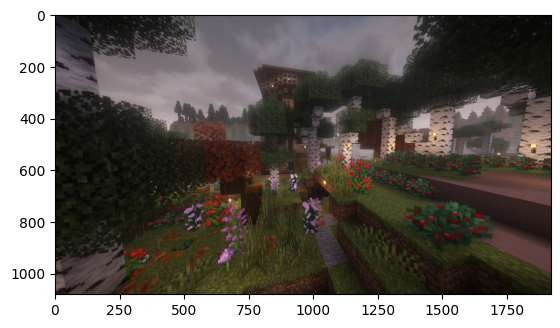

In [53]:
newImg_BGR = cv2.imread('base.png')
newImg_RGB = cv2.cvtColor(newImg_BGR, cv2.COLOR_BGR2RGB)

plt.imshow(newImg_RGB)

  - Use an external image and apply the noise generation functions covered earlier.

    - Experiment with different parameter values for the noise functions.

    - Plot histograms of both the original image and the noisy images.

    - Write short observations about the differences between the original and noisy images.

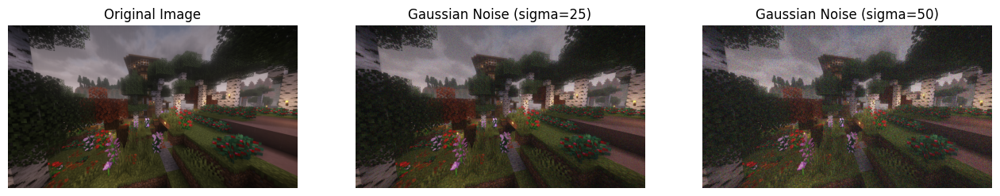

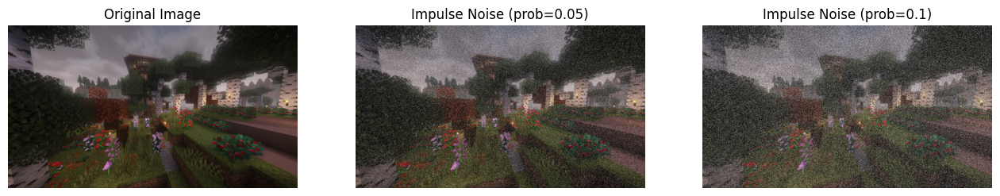

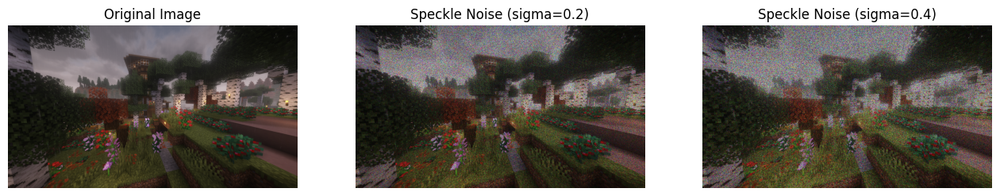

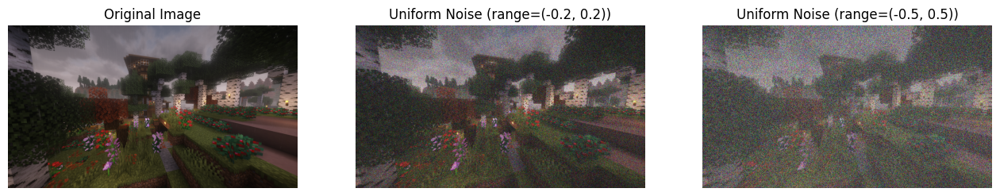

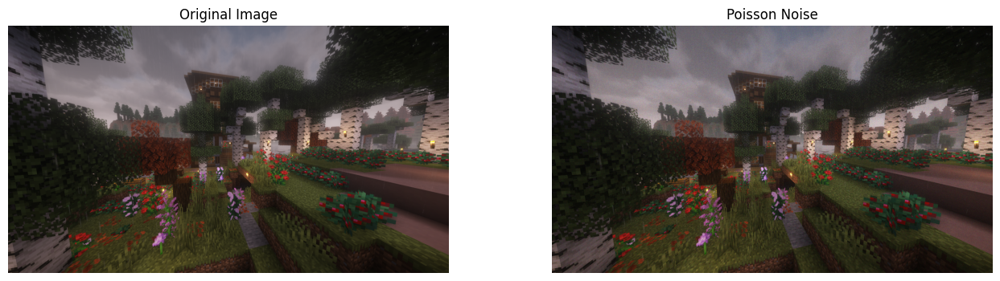

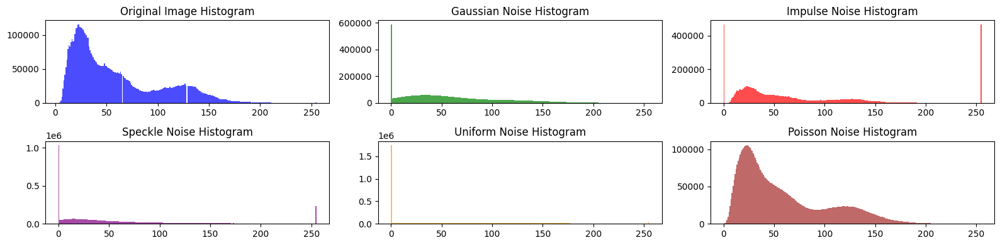

In [54]:
#     - Experiment with different parameter values for the noise functions.
noise1_img_gaussian = add_gaussian_noise(newImg_RGB, mean=0, sigma=25)
noise1_img_impulse = add_impulse_noise(newImg_RGB, prob=0.15)
noise1_img_speckle = add_speckle_noise(newImg_RGB, sigma=1)   
noise1_img_uniform = add_uniform_noise(newImg_RGB, noise_range=(-0.5, 0.5))
noise1_img_poisson = add_poisson_noise(newImg_RGB)

noise2_img_gaussian = add_gaussian_noise(newImg_RGB, mean=0, sigma=50)
noise2_img_impulse = add_impulse_noise(newImg_RGB, prob=0.3)
noise2_img_speckle = add_speckle_noise(newImg_RGB, sigma=2)   
noise2_img_uniform = add_uniform_noise(newImg_RGB, noise_range=(-1, 1))
noise2_img_poisson = add_poisson_noise(newImg_RGB)
 
# Gaussian Noise
plt.figure(figsize=(16, 4))
plt.subplot(1, 3, 1)
plt.imshow(newImg_RGB)
plt.title('Original Image')
plt.axis('off')
plt.subplot(1, 3, 2)
plt.imshow(noise1_img_gaussian)
plt.title('Gaussian Noise (sigma=25)')
plt.axis('off')
plt.subplot(1, 3, 3)
plt.imshow(noise2_img_gaussian)
plt.title('Gaussian Noise (sigma=50)')
plt.axis('off')
plt.show()

# Impulse Noise
plt.figure(figsize=(16, 4))
plt.subplot(1, 3, 1)
plt.imshow(newImg_RGB)
plt.title('Original Image')
plt.axis('off')
plt.subplot(1, 3, 2)
plt.imshow(noise1_img_impulse)
plt.title('Impulse Noise (prob=0.05)')
plt.axis('off')
plt.subplot(1, 3, 3)
plt.imshow(noise2_img_impulse)
plt.title('Impulse Noise (prob=0.1)')
plt.axis('off')
plt.show()

# Speckle Noise
plt.figure(figsize=(16, 4))
plt.subplot(1, 3, 1)
plt.imshow(newImg_RGB)
plt.title('Original Image')
plt.axis('off')
plt.subplot(1, 3, 2)
plt.imshow(noise1_img_speckle)
plt.title('Speckle Noise (sigma=0.2)')
plt.axis('off')
plt.subplot(1, 3, 3)
plt.imshow(noise2_img_speckle)
plt.title('Speckle Noise (sigma=0.4)')
plt.axis('off')
plt.show()

# Uniform Noise
plt.figure(figsize=(16, 4))
plt.subplot(1, 3, 1)
plt.imshow(newImg_RGB)
plt.title('Original Image')
plt.axis('off')
plt.subplot(1, 3, 2)
plt.imshow(noise1_img_uniform)
plt.title('Uniform Noise (range=(-0.2, 0.2))')
plt.axis('off')
plt.subplot(1, 3, 3)
plt.imshow(noise2_img_uniform)
plt.title('Uniform Noise (range=(-0.5, 0.5))')
plt.axis('off')
plt.show()

# Poisson Noise
plt.figure(figsize=(16, 4))
plt.subplot(1, 2, 1)
plt.imshow(newImg_RGB)
plt.title('Original Image')
plt.axis('off')
plt.subplot(1, 2, 2)
plt.imshow(noise1_img_poisson)
plt.title('Poisson Noise')
plt.axis('off')
plt.show()

#     - Plot histograms of both the original image and the noisy images.

plt.figure(figsize=(16, 4))
plt.subplot(2, 3, 1)
plt.hist(newImg_RGB.ravel(), bins=256, color='blue', alpha=0.7)
plt.title('Original Image Histogram')
plt.subplot(2, 3, 2)
plt.hist(noise1_img_gaussian.ravel(), bins=256, color='green', alpha=0.7)
plt.title('Gaussian Noise Histogram')
plt.subplot(2, 3, 3)
plt.hist(noise1_img_impulse.ravel(), bins=256, color='red', alpha=0.7)
plt.title('Impulse Noise Histogram')
plt.subplot(2, 3, 4)
plt.hist(noise1_img_speckle.ravel(), bins=256, color='purple', alpha=0.7)
plt.title('Speckle Noise Histogram')
plt.subplot(2, 3, 5)
plt.hist(noise1_img_uniform.ravel(), bins=256, color='orange', alpha=0.7)
plt.title('Uniform Noise Histogram')
plt.subplot(2, 3, 6)
plt.hist(noise1_img_poisson.ravel(), bins=256, color='brown', alpha=0.7)
plt.title('Poisson Noise Histogram')
plt.tight_layout()
plt.show()

#     - Write short observations about the differences between the original and noisy images.
# Observations:
# Gaussian noise: ảnh sau khi thêm nhiễu có vẻ mờ hơn.
# Impulse noise: xuất hiện các điểm trắng và đen giống như "lỗ" ngẫu nhiên trên ảnh.
# Speckle noise: ảnh có nhìn bị nhiễu và mau sắc bị biến đổi.
# Uniform noise: ảnh có vẻ nhiễu đều hơn và trông "trắng" hơn so với ảnh gốc.
# Poisson noise: ảnh có vẻ nhiễu nhiều hơn ở các vùng sáng so với ảnh gốc.

  - Add Gaussian, Salt & Pepper, Speckle, and Poisson noise to the same image with different intensity levels.

    - Plot histograms and compare their shapes.

    - How does each noise type affect bright and dark regions differently?

    - Which type of noise is more perceptually noticeable?

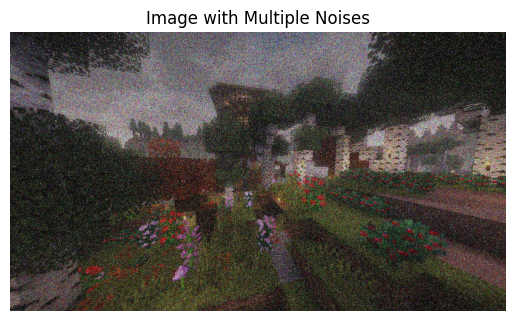

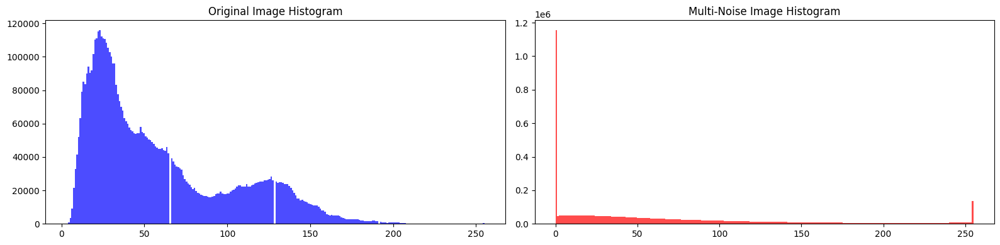

In [55]:

multi_noise_images = add_gaussian_noise(newImg_RGB, mean=0, sigma=30)
multi_noise_images = add_impulse_noise(multi_noise_images, prob=0.1)
multi_noise_images = add_speckle_noise(multi_noise_images, sigma=0.5)
multi_noise_images = add_poisson_noise(multi_noise_images)
plt.imshow(multi_noise_images)
plt.title('Image with Multiple Noises')
plt.axis('off')
plt.show()


#     - Plot histograms and compare their shapes.
plt.figure(figsize=(16, 4))
plt.subplot(1, 2, 1)
plt.hist(newImg_RGB.ravel(), bins=256, color='blue', alpha=0.7)
plt.title('Original Image Histogram')
plt.subplot(1, 2, 2)
plt.hist(multi_noise_images.ravel(), bins=256, color='red', alpha=0.7)
plt.title('Multi-Noise Image Histogram')
plt.tight_layout()
plt.show()
# So sánh giữa các histogram:
# Ta thấy sau khi ảnh đã được xử lý với nhiều loại nhiễu khác nhau thì histogram của ảnh khi này phẳng hơn so với ảnh gốc và có nhiều giá trị pixel phân bố với giá trị đều hơn nhưng có hình dạng thay đổi theo của ảnh gốc


#     - How does each noise type affect bright and dark regions differently?
# Gaussian noise: Ảnh sáng và tối đều bị ảnh hưởng, nhưng ảnh sáng có vẻ bị nhiễu nhiều hơn.
# Impulse noise: Ảnh sáng và tối đều bị ảnh hưởng, nhưng các điểm nhiễu xuất hiện ngẫu nhiên.
# Speckle noise: Ảnh sáng bị ảnh hưởng nhiều hơn so với ảnh tối.
# Uniform noise: Ảnh sáng và tối đều bị ảnh hưởng
# Poisson noise: Ảnh sáng bị ảnh hưởng nhiều hơn so với ảnh tối.

#    - Which type of noise is more perceptually noticeable?
# Trong các loại nhiễu đã thêm vào, Impulse noise là loại dễ nhận thấy nhất do sự xuất hiện của các điểm trắng và đen rõ ràng trên ảnh.
# Gaussian cũng khá dễ nhận thấy do nó tạo hiệu ứng mờ trên ảnh. 
# Nhiễu speckle và Poisson có thể khó nhận thấy hơn tùy thuộc vào cường độ của chúng.

## 3. Harmonic Mean and Geometric Mean Filters

  - Find an image from the internet and perform the following steps:

    - Add noise to the image using the previously introduced noise methods.

    - Apply Harmonic Mean Filter and Geometric Mean Filter with kernel sizes 3×3 and 5×5.

    - Compare the denoising results and write short
    comments:

      - Which type of noise is reduced effectively?

      - Which type of noise remains unaffected?

      - Explain why these filters perform better or worse depending on the noise type.

Find an image from the internet

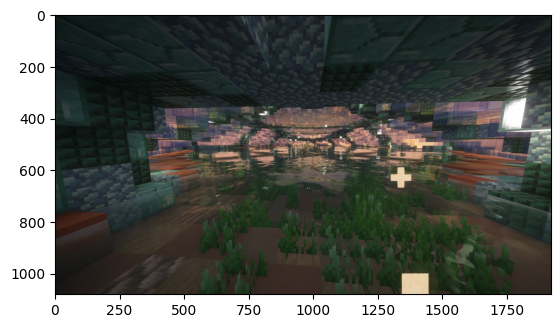

In [56]:
newImg2_BGR = cv2.imread('sea.png')
newImg2_RGB = cv2.cvtColor(newImg2_BGR, cv2.COLOR_BGR2RGB)
plt.imshow(newImg2_RGB)


Add noise to the image using the previously introduced noise methods.

In [57]:
newImg2_gaussian = add_gaussian_noise(newImg2_RGB, mean=0, sigma=50)
newImg2_impulse = add_impulse_noise(newImg2_RGB, prob=0.2)
newImg2_speckle = add_speckle_noise(newImg2_RGB, sigma=1)
newImg2_uniform = add_uniform_noise(newImg2_RGB, noise_range=(-0.5, 0.5))
newImg2_poisson = add_poisson_noise(newImg2_RGB)


Apply Harmonic Mean Filter and Geometric Mean Filter with kernel sizes 3×3 and 5×5.

In [58]:
 
# Harmonic Mean Filter
newImg2_harmonic3x3 = harmonic_mean_filter(newImg2_impulse, kernel_size=3)
newImg2_harmonic5x5 = harmonic_mean_filter(newImg2_impulse, kernel_size=5)
# Geometric Mean Filter
newImg2_geometric3x3 = geometric_mean_filter(newImg2_impulse, kernel_size=3)
newImg2_geometric5x5 = geometric_mean_filter(newImg2_impulse, kernel_size=5)


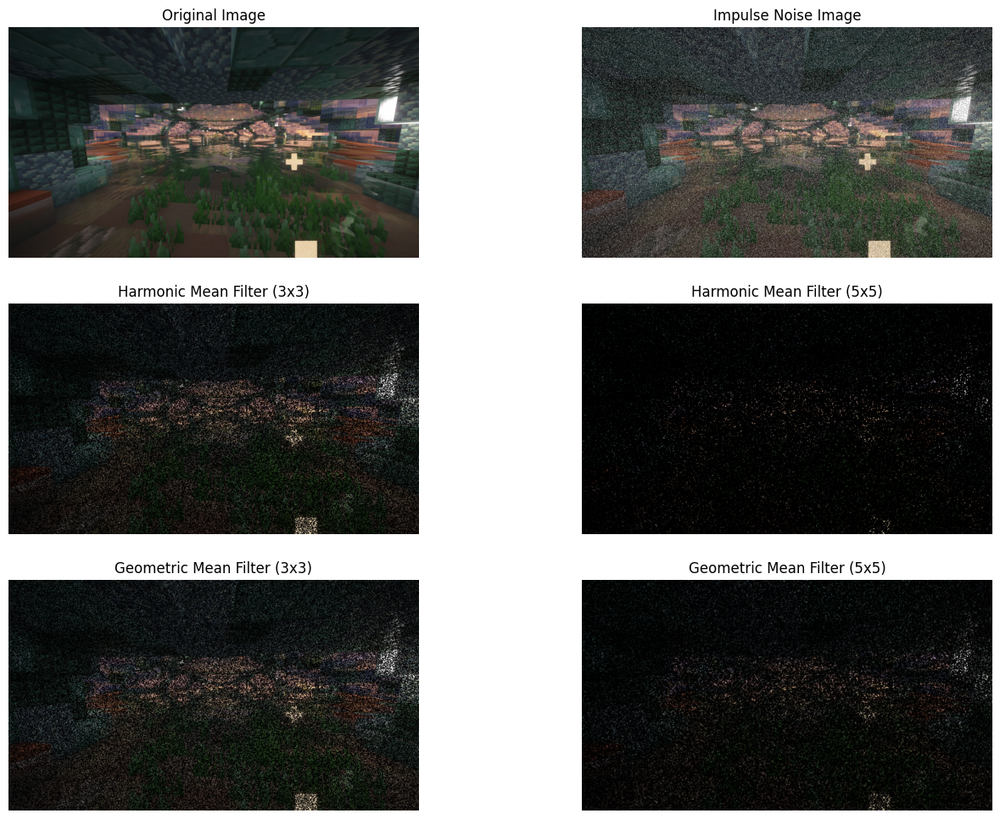

In [59]:
plt.figure(figsize=(16, 12))
plt.subplot(3, 2, 1)
plt.imshow(newImg2_RGB)
plt.title('Original Image')
plt.axis('off')
plt.subplot(3, 2, 2)
plt.imshow(newImg2_impulse)
plt.title('Impulse Noise Image')
plt.axis('off')
plt.subplot(3, 2, 3)
plt.imshow(newImg2_harmonic3x3)
plt.title('Harmonic Mean Filter (3x3)')
plt.axis('off')
plt.subplot(3, 2, 4)
plt.imshow(newImg2_harmonic5x5)
plt.title('Harmonic Mean Filter (5x5)')
plt.axis('off')
plt.subplot(3, 2, 5)
plt.imshow(newImg2_geometric3x3)
plt.title('Geometric Mean Filter (3x3)')
plt.axis('off')
plt.subplot(3, 2, 6)
plt.imshow(newImg2_geometric5x5)
plt.title('Geometric Mean Filter (5x5)')
plt.axis('off')
plt.show()




Compare the denoising results and write short comments:
- Which type of noise is reduced effectively?

- Which type of noise remains unaffected?

- Explain why these filters perform better or worse depending on the noise type.

In [60]:
#- Which type of noise is reduced effectively?

# Cả hai bộ lọc đều hoạt động tốt trong việc giảm nhiễu xung (impulse noise). Tuy nhiên, bộ lọc trung bình hình học (Geometric Mean Filter) có xu hướng giữ lại nhiều chi tiết hơn so với bộ lọc trung bình điều hòa (Harmonic Mean Filter).

#- Which type of noise remains unaffected?
# Cả hai bộ lọc đều không hiệu quả trong việc giảm nhiễu Gaussian, speckle, uniform và Poisson.

#- Explain why these filters perform better or worse depending on the noise type.
# Harmonic Mean Filter hoạt động tốt trong việc giảm nhiễu xung vì nó nhấn mạnh các giá trị nhỏ trong vùng lân cận, giúp loại bỏ các điểm nhiễu lớn. Tuy nhiên, nó có thể làm mờ các chi tiết trong ảnh.
# Geometric Mean Filter cũng hiệu quả trong việc giảm nhiễu xung và có khả năng giữ lại chi tiết tốt hơn do tính chất của nó trong việc xử lý các giá trị pixel trong vùng lân cận.

## 4. Applying Basic Convolution Filters

Task:
Choose an image from the internet and perform the following operations:

- Apply blurring filters with kernel sizes 3×3 and 5×5. Compute and display the blur measurement value for each filtered image. Overlay the blur value text directly on the image.

- Apply sharpening filters. Compute and display the sharpness measurement value for each image. Overlay the sharpness value text on the image.

- Additional Tasks:

  - Define a blur threshold based on the blur measurement values.

  - For each image:

    - If the image exceeds the blur threshold → add the label “Blur Image: [value]”.

    - Otherwise → label the image as “Good Image”.

    - Save all evaluated images into a folder named “Image_BlurDetection_Output”.


  - Apply edge detection filters and describe their purpose and visual meaning.


Apply blurring filters with kernel sizes 3×3 and 5×5. Compute and display the blur measurement value for each filtered image. Overlay the blur value text directly on the image.



Filtering Kernel 3x3:


array([[0.11111111, 0.11111111, 0.11111111],
       [0.11111111, 0.11111111, 0.11111111],
       [0.11111111, 0.11111111, 0.11111111]], dtype=float32)

Filtering Kernel 5x5:


array([[0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04]], dtype=float32)

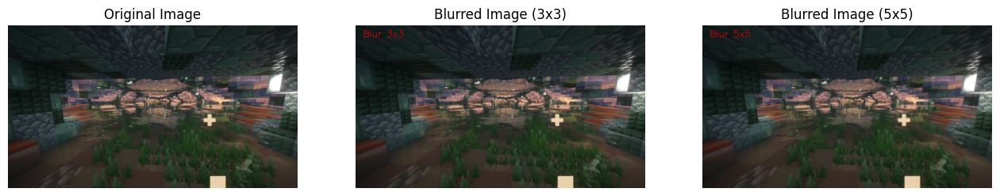

In [61]:
def blurringNxN(image, n, display_blur = False):
    blur_kernel = np.ones((n,n),np.float32)/(n*n)
    if display_blur:
        print(f"Filtering Kernel {n}x{n}:")
        display(blur_kernel)
        
    blurred_image = cv2.filter2D(image, -1, blur_kernel)
    return blurred_image
newImg2_blur3x3 = blurringNxN(newImg2_RGB, 3, display_blur=True)
newImg2_blur5x5 = blurringNxN(newImg2_RGB, 5, display_blur=True)

# Overlay the blur value text directly on the image.
cv2.putText(newImg2_blur3x3, 'Blur 3x3', (50,80), cv2.FONT_HERSHEY_SIMPLEX, 2, (255,0,0), 2, cv2.LINE_AA)
cv2.putText(newImg2_blur5x5, 'Blur 5x5', (50,80), cv2.FONT_HERSHEY_SIMPLEX, 2, (255,0,0), 2, cv2.LINE_AA)

plt.figure(figsize=(16, 4))
plt.subplot(1, 3, 1)
plt.imshow(newImg2_RGB)
plt.title('Original Image')
plt.axis('off')
plt.subplot(1, 3, 2)
plt.imshow(newImg2_blur3x3)
plt.title('Blurred Image (3x3)')
plt.axis('off')
plt.subplot(1, 3, 3)
plt.imshow(newImg2_blur5x5)
plt.title('Blurred Image (5x5)')
plt.axis('off')
plt.show()



Apply sharpening filters. Compute and display the sharpness measurement value for each image. Overlay the sharpness value text on the image.

Sharpening Kernel :


array([[-1, -1, -1],
       [-1,  9, -1],
       [-1, -1, -1]])

Sharpening Kernel :


array([[ 0, -1,  0],
       [-1,  5, -1],
       [ 0, -1,  0]])

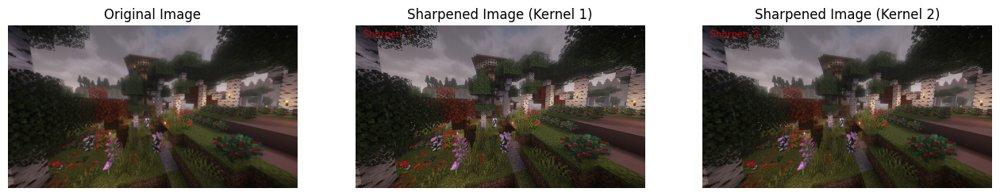

In [62]:
def sharpening(image, sharp_kernel, display_sharpen = False):
    if display_sharpen:
        print(f"Sharpening Kernel :")
        display(sharp_kernel)
        
    sharpened_image = cv2.filter2D(image, -1, sharp_kernel)
    return sharpened_image

sharp_kernel1 = np.array([[-1, -1, -1],
                          [-1,  9, -1],
                          [-1, -1, -1]])
sharp_kernel2 = np.array([[0, -1, 0],
                          [-1, 5, -1],
                          [0, -1, 0]])

newImg_sharp1 = sharpening(newImg_RGB, sharp_kernel1, display_sharpen=True)
newImg_sharp2 = sharpening(newImg_RGB, sharp_kernel2, display_sharpen=True)
cv2.putText(newImg_sharp1, 'Sharpen 1', (50,80), cv2.FONT_HERSHEY_SIMPLEX, 2, (255,0,0), 2, cv2.LINE_AA)
cv2.putText(newImg_sharp2, 'Sharpen 2', (50,80), cv2.FONT_HERSHEY_SIMPLEX, 2, (255,0,0), 2, cv2.LINE_AA)
plt.figure(figsize=(16, 4))
plt.subplot(1, 3, 1)
plt.imshow(newImg_RGB)
plt.title('Original Image')
plt.axis('off')
plt.subplot(1, 3, 2)
plt.imshow(newImg_sharp1)
plt.title('Sharpened Image (Kernel 1)')
plt.axis('off')
plt.subplot(1, 3, 3)
plt.imshow(newImg_sharp2)
plt.title('Sharpened Image (Kernel 2)')
plt.axis('off')
plt.show()




- Additional Tasks:

  - Define a blur threshold based on the blur measurement values.

  - For each image:

    - If the image exceeds the blur threshold → add the label “Blur Image: [value]”.

    - Otherwise → label the image as “Good Image”.

    - Save all evaluated images into a folder named “Image_BlurDetection_Output”.


In [63]:

# Create folder
output_folder = "Image_BlurDetection_Output"
if not os.path.exists(output_folder): # safe check if output folder exists
    os.makedirs(output_folder)  # create output folder
def variance_of_laplacian(image):
    return cv2.Laplacian(image, cv2.CV_64F).var()

# Define a blur threshold
blur_threshold = 100.0  
images = {
    "Original": newImg_RGB,
    "Blurred 3x3": newImg2_blur3x3,
    "Blurred 5x5": newImg2_blur5x5,
    "Sharpened 1": newImg_sharp1,
    "Sharpened 2": newImg_sharp2
}

    
# - Save all evaluated images into a folder named “Image_BlurDetection_Output”.
for name, img in images.items():
    gray_img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    blur_value = variance_of_laplacian(gray_img)
    # Check blur value
    if blur_value < blur_threshold:
        text = f"Blur Image: {blur_value:.2f}"
    else:
        text = "Good Image"
    img_with_text = img.copy()
    cv2.putText(img_with_text, text, (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 0, 0), 2)
    output_path = os.path.join(output_folder, f"{name.replace(' ', '_')}.png")
    cv2.imwrite(output_path, cv2.cvtColor(img_with_text, cv2.COLOR_RGB2BGR))




Apply edge detection filters and describe their purpose and visual meaning.

Sobel Filter

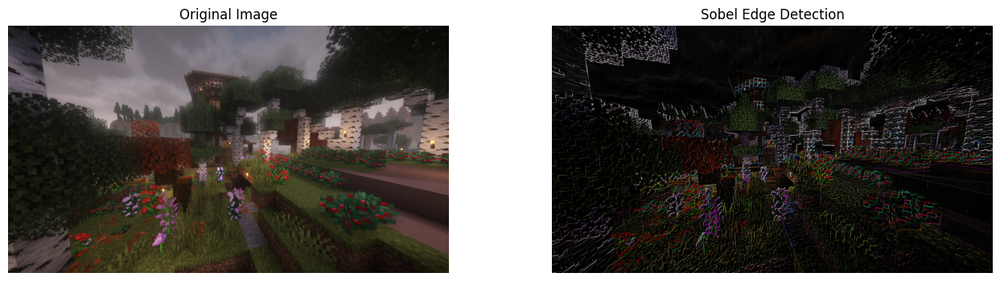

In [64]:

def sobel_edge_detection(image):
    kernel_sobelX = np.array((
        [-1, 0, 1],
        [-2, 0, 2],
        [-1, 0, 1]), dtype="int")

    # construct the Sobel y-axis kernel
    kernel_sobelY = np.array((
        [-1, -2, -1],
        [0, 0, 0],
        [1, 2, 1]), dtype="int")
    
    image_color_edge_sobelX = cv2.filter2D(image, -1, kernel_sobelX)
    image_color_edge_sobelY = cv2.filter2D(image, -1, kernel_sobelY)
    image_color_edge = image_color_edge_sobelX + image_color_edge_sobelY
    return image_color_edge

newImg_edge_sobel = sobel_edge_detection(newImg_RGB)
plt.figure(figsize=(16, 4))
plt.subplot(1, 2, 1)
plt.imshow(newImg_RGB)
plt.title('Original Image')
plt.axis('off')
plt.subplot(1, 2, 2)
plt.imshow(newImg_edge_sobel)
plt.title('Sobel Edge Detection')
plt.axis('off')
plt.show()



Laplacian-like Filter

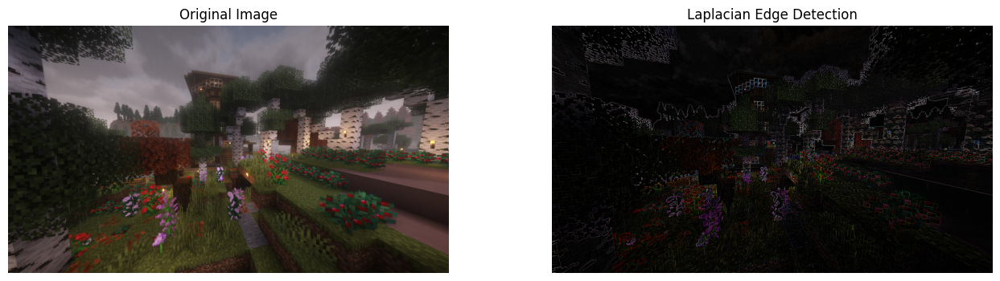

In [65]:
def laplacian_edge_detection(image):
    edge_kernel = np.array([[-1, -1, -1],
                            [-1,  8, -1],
                            [-1, -1, -1]], np.float32)
    image_color_edge = cv2.filter2D(image, -1, edge_kernel)
    return image_color_edge

newImg_edge_laplacian = laplacian_edge_detection(newImg_RGB)
plt.figure(figsize=(16, 4))
plt.subplot(1, 2, 1)
plt.imshow(newImg_RGB)
plt.title('Original Image')
plt.axis('off')
plt.subplot(1, 2, 2)
plt.imshow(newImg_edge_laplacian)
plt.title('Laplacian Edge Detection')
plt.axis('off')
plt.show()

## 5. Report

- Display the original image and all transformed images.

- Write a short commentary comparing the visual differences between them and describe what you observe from each transformation.

### 5.1 Display the original image and all transformed images.

#### 5.1.1. Noises

Gaussian Noise

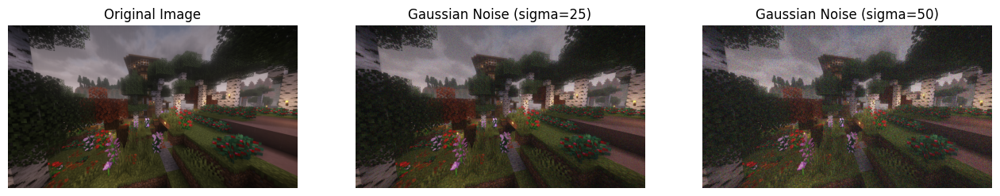

In [66]:
plt.figure(figsize=(16, 4))
plt.subplot(1, 3, 1)
plt.imshow(newImg_RGB)
plt.title('Original Image')
plt.axis('off')
plt.subplot(1, 3, 2)
plt.imshow(noise1_img_gaussian)
plt.title('Gaussian Noise (sigma=25)')
plt.axis('off')
plt.subplot(1, 3, 3)
plt.imshow(noise2_img_gaussian)
plt.title('Gaussian Noise (sigma=50)')
plt.axis('off')
plt.show()


Impulse Noise

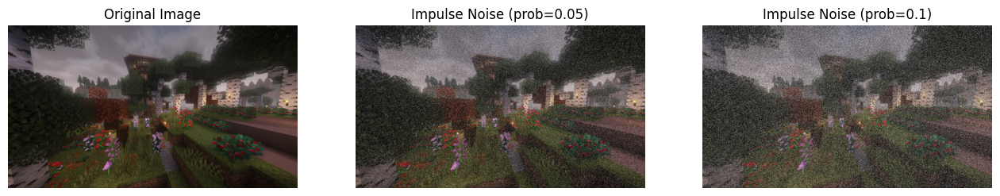

In [67]:
plt.figure(figsize=(16, 4))
plt.subplot(1, 3, 1)
plt.imshow(newImg_RGB)
plt.title('Original Image')
plt.axis('off')
plt.subplot(1, 3, 2)
plt.imshow(noise1_img_impulse)
plt.title('Impulse Noise (prob=0.05)')
plt.axis('off')
plt.subplot(1, 3, 3)
plt.imshow(noise2_img_impulse)
plt.title('Impulse Noise (prob=0.1)')
plt.axis('off')
plt.show()

Speckle Noise


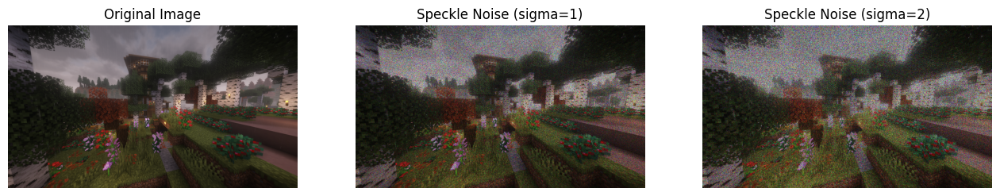

In [68]:
plt.figure(figsize=(16, 4))
plt.subplot(1, 3, 1)
plt.imshow(newImg_RGB)
plt.title('Original Image')
plt.axis('off')
plt.subplot(1, 3, 2)
plt.imshow(noise1_img_speckle)
plt.title('Speckle Noise (sigma=1)')
plt.axis('off')
plt.subplot(1, 3, 3)
plt.imshow(noise2_img_speckle)
plt.title('Speckle Noise (sigma=2)')
plt.axis('off')
plt.show()

Uniform Noise

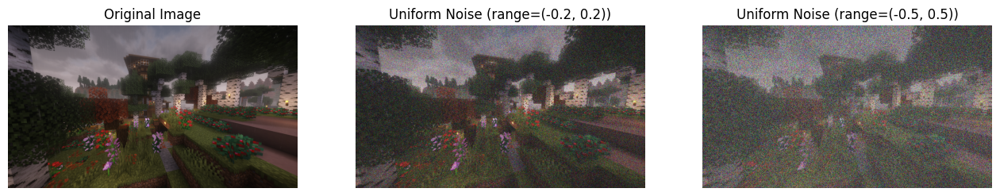

In [69]:
plt.figure(figsize=(16, 4))
plt.subplot(1, 3, 1)
plt.imshow(newImg_RGB)
plt.title('Original Image')
plt.axis('off')
plt.subplot(1, 3, 2)
plt.imshow(noise1_img_uniform)
plt.title('Uniform Noise (range=(-0.2, 0.2))')
plt.axis('off')
plt.subplot(1, 3, 3)
plt.imshow(noise2_img_uniform)
plt.title('Uniform Noise (range=(-0.5, 0.5))')
plt.axis('off')
plt.show()


Poisson Noise

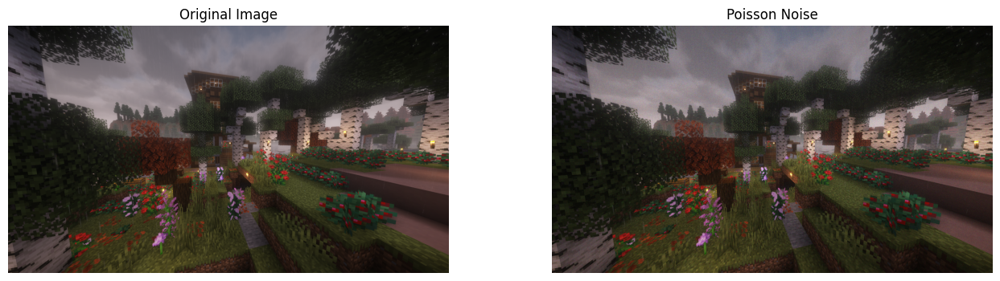

In [70]:
plt.figure(figsize=(16, 4))
plt.subplot(1, 2, 1)
plt.imshow(newImg_RGB)
plt.title('Original Image')
plt.axis('off')
plt.subplot(1, 2, 2)
plt.imshow(noise1_img_poisson)
plt.title('Poisson Noise')
plt.axis('off')
plt.show()

Multiple Noises

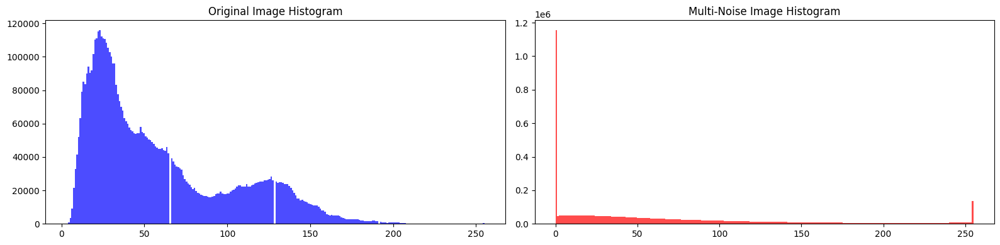

In [71]:
plt.figure(figsize=(16, 4))
plt.subplot(1, 2, 1)
plt.hist(newImg_RGB.ravel(), bins=256, color='blue', alpha=0.7)
plt.title('Original Image Histogram')
plt.subplot(1, 2, 2)
plt.hist(multi_noise_images.ravel(), bins=256, color='red', alpha=0.7)
plt.title('Multi-Noise Image Histogram')
plt.tight_layout()
plt.show()

#### 5.1.2. Filters

Harmonic Mean Filter

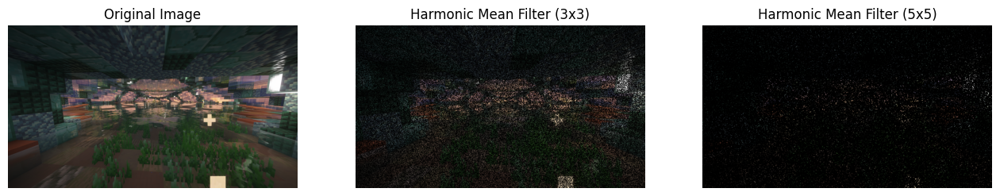

In [72]:
# Harmonic Mean Filter
plt.figure(figsize=(16, 4))
plt.subplot(1, 3, 1)
plt.imshow(newImg2_RGB)
plt.title('Original Image')
plt.axis('off')
plt.subplot(1, 3, 2)
plt.imshow(newImg2_harmonic3x3)
plt.title('Harmonic Mean Filter (3x3)')
plt.axis('off')
plt.subplot(1, 3, 3)
plt.imshow(newImg2_harmonic5x5)
plt.title('Harmonic Mean Filter (5x5)')
plt.axis('off')
plt.show()


Geometric Mean Filter

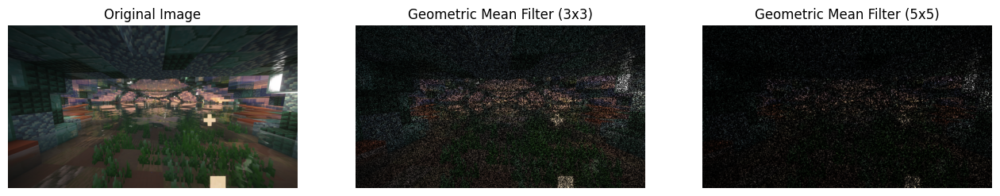

In [73]:
# Geometric Mean Filter
plt.figure(figsize=(16, 4))
plt.subplot(1, 3, 1)
plt.imshow(newImg2_RGB)
plt.title('Original Image')
plt.axis('off')
plt.subplot(1, 3, 2)
plt.imshow(newImg2_geometric3x3)
plt.title('Geometric Mean Filter (3x3)')
plt.axis('off')
plt.subplot(1, 3, 3)
plt.imshow(newImg2_geometric5x5)
plt.title('Geometric Mean Filter (5x5)')
plt.axis('off')
plt.show()



Blurring filter

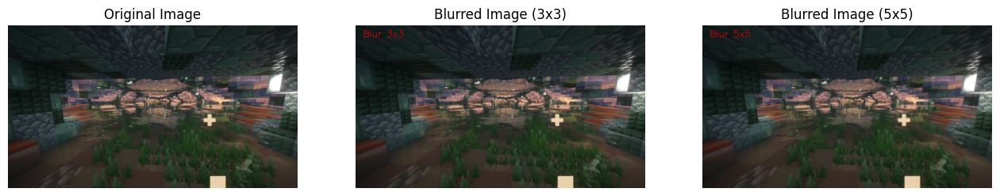

In [74]:
plt.figure(figsize=(16, 4))
plt.subplot(1, 3, 1)
plt.imshow(newImg2_RGB)
plt.title('Original Image')
plt.axis('off')
plt.subplot(1, 3, 2)
plt.imshow(newImg2_blur3x3)
plt.title('Blurred Image (3x3)')
plt.axis('off')
plt.subplot(1, 3, 3)
plt.imshow(newImg2_blur5x5)
plt.title('Blurred Image (5x5)')
plt.axis('off')
plt.show()

Sharpening filter

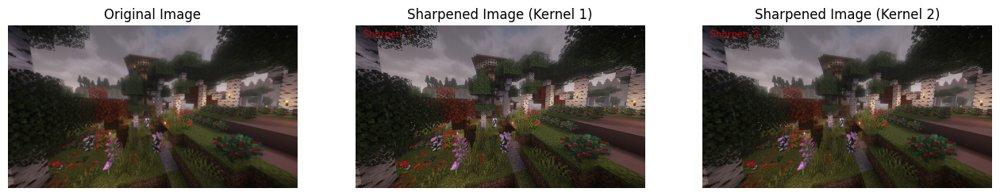

In [75]:
plt.figure(figsize=(16, 4))
plt.subplot(1, 3, 1)
plt.imshow(newImg_RGB)
plt.title('Original Image')
plt.axis('off')
plt.subplot(1, 3, 2)
plt.imshow(newImg_sharp1)
plt.title('Sharpened Image (Kernel 1)')
plt.axis('off')
plt.subplot(1, 3, 3)
plt.imshow(newImg_sharp2)
plt.title('Sharpened Image (Kernel 2)')
plt.axis('off')
plt.show()


Sobel Filter

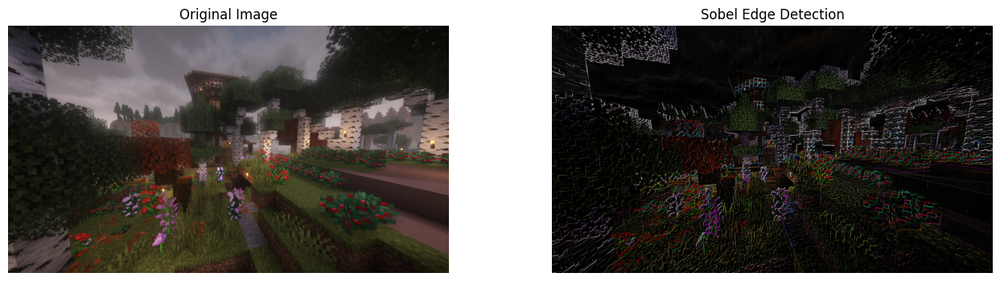

In [76]:
plt.figure(figsize=(16, 4))
plt.subplot(1, 2, 1)
plt.imshow(newImg_RGB)
plt.title('Original Image')
plt.axis('off')
plt.subplot(1, 2, 2)
plt.imshow(newImg_edge_sobel)
plt.title('Sobel Edge Detection')
plt.axis('off')
plt.show()

Laplacian-like Filter


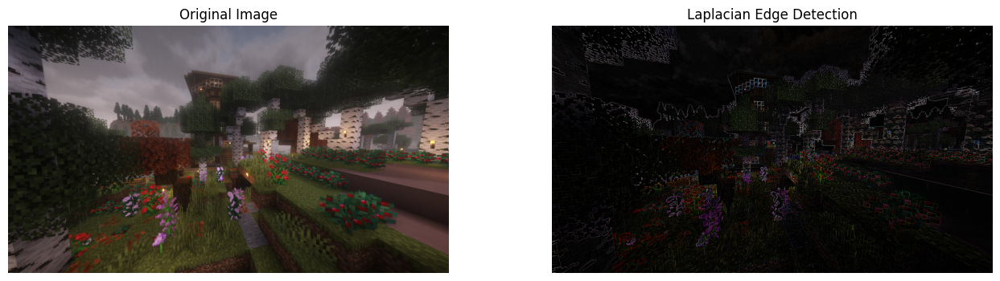

In [77]:
plt.figure(figsize=(16, 4))
plt.subplot(1, 2, 1)
plt.imshow(newImg_RGB)
plt.title('Original Image')
plt.axis('off')
plt.subplot(1, 2, 2)
plt.imshow(newImg_edge_laplacian)
plt.title('Laplacian Edge Detection')
plt.axis('off')
plt.show()

### 5.2 Write a short commentary comparing the visual differences between them and describe what you observe from each transformation.
- Noises:

    - Gaussian Noise:
    Nhìn ảnh như bị mờ hay hạt toàn bộ, cả vùng sáng lẫn vùng tối đều bị ảnh hưởng như nhau.

    - Impulse Noise: Xuất hiện các hạt đen và trắng rải rác khắp nơi. Làm ảnh có cảm giác sáng hơn ảnh gốc

    - Speckle Noise: Ảnh bị nhiễu màu, nhiễu giống Impulse Noise nhưng khác nhau ở việc Speckle làm nhiễu màu chứ không phải chỉ là đen trắng như Impulse Noise.
    - Uniform Noise: Ảnh cũng bị nhiễu màu giống như Speckle Noise và ảnh còn cảm giác bị mờ trắng hơn.
    - Poisson Noise: Xuất hiện các hạt đen và trắng rải rác khắp nơi nhưng mà các hạt đó "mịn" hơn so với Impulse Noise.

    - Multiple Noises: Khi ảnh bị nhiễu cùng lúc nhiều loại nhiễu thì ảnh nhìn rất là tệ, mờ và xuất hiện nhiều hạt ở khắp nơi, rất khó chịu để nhìn vào

- Filters:

    -  Harmonic Mean Filter: Rất tốt trong phát hiện Impulse Noise. Tuy nhiên, với Gaussian Noise thì nó làm không tốt lắm, ảnh vẫn hơi mờ.

    - Geometric Mean Filter: Bộ lọc này khá cân bằng trong việc lọc các hạt ảnh đều hơn so với Harmonic Mean Filter.

    - Blurring filter: Làm cho ảnh mờ đi, giảm bớt các chi tiết nhỏ và nhiễu. Tuy nhiên, nếu ảnh gốc đã bị mờ thì bộ lọc này sẽ làm ảnh càng mờ hơn nữa.

    - Sharpening filter: Giúp làm nổi bật các cạnh và chi tiết, ảnh trông sắc sảo, "giòn" hơn.

    - Sober Filter: Giúp phát hiện các cạnh trong ảnh, làm nổi bật các vùng chuyển đổi đột ngột về màu sắc hay độ sáng.

    - Laplacian-like Filter: Cũng giúp phát hiện cạnh nhưng nhấn mạnh hơn vào các điểm có sự thay đổi lớn về cường độ ánh sáng, làm nổi bật các chi tiết nhỏ hơn so với Sobel Filter.